In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))
import numpy as np
import pandas as pd
import h5py
from tqdm import tqdm
import scipy.io as sio
from scipy import stats
from importlib import reload
from matplotlib import pyplot as plt
import sys
sys.path.append('/home/jma819/post_cmfe_analysis')
#sys.path.append('/Users/johnmarshall/Documents/Analysis/PythonAnalysisScripts/post_cmfe_analysis')
import python_utils_jjm as utils_jjm
import dlc_utils
import caiman
from sklearn.preprocessing import MinMaxScaler
import scipy.spatial.distance as dist
import itertools
import math
import warnings
%matplotlib inline
from matplotlib import pyplot as plt
from matplotlib import animation, rc
from IPython.display import HTML
import av
import seaborn as sns
warnings.filterwarnings(action='once')

/home/jma819/.conda/envs/caiman/lib/python3.6/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.decomposition.incremental_pca module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.decomposition. Anything that cannot be imported from sklearn.decomposition is now part of the private API.
  warnings.warn(message, FutureWarning)


In [2]:
reload(utils_jjm)
reload(dlc_utils)

/home/jma819/.conda/envs/caiman/lib/python3.6/site-packages/jupyter_client/jsonutil.py:67: DeprecationWarning: Interpreting naive datetime as local 2021-02-22 16:34:44.339523. Please add timezone info to timestamps.
  new_obj[k] = extract_dates(v)


<module 'dlc_utils' from '/home/jma819/post_cmfe_analysis/dlc_utils.py'>

In [3]:
#cnmfe_file_key = pd.read_csv('/Volumes/My_Passport/dlc_analysis/behavcamvideos/open_field_miniscope/cnmfe_key.csv')
cnmfe_file_key = pd.read_csv('/projects/p30771/dlc_analysis/openfield_dlc_output/cnmfe_key.csv')

/home/jma819/.conda/envs/caiman/lib/python3.6/site-packages/jupyter_client/jsonutil.py:67: DeprecationWarning: Interpreting naive datetime as local 2021-02-22 16:34:44.347050. Please add timezone info to timestamps.
  new_obj[k] = extract_dates(v)


In [4]:
#cnmfe_base_dir = '/Volumes/My_Passport/cnmfe_analysis_files/batch_output_files/'
cnmfe_base_dir = '/projects/p30771/MATLAB/CNMF_E_jjm/quest_MATLAB_cnmfe/batch_output_files/'
# '27-Feb_17_33_59_out.mat' '28-Feb_16_21_21_out.mat' '25-Mar_14_22_02_out.mat', '25-Mar_14_22_44_out.mat', '26-Mar_18_33_55_out.mat', '27-Mar_00_26_12_out.mat', '27-Mar_00_48_46_out.mat' throwing error
wt_CNMFE_files = ['29-Jan_12_35_06_out.mat','30-Mar_20_39_05_out.mat', '30-Mar_20_45_16_out.mat', '22-Mar_22_52_02_out.mat',
                 '28-Feb_16_10_05_out.mat', '27-Feb_17_32_15_out.mat', '25-Mar_13_27_27_out.mat',
                 '27-Feb_17_33_59_out.mat', '28-Feb_16_21_21_out.mat', '25-Mar_14_22_02_out.mat', '25-Mar_14_22_44_out.mat', 
                  '26-Mar_18_33_55_out.mat', '27-Mar_00_26_12_out.mat', '27-Mar_00_48_46_out.mat']

ko_CNMFE_files = ['30-Jan_16_54_31_out.mat','30-Jan_14_00_19_out.mat','31-Jan_01_43_49_out.mat','31-Jan_00_12_24_out.mat','31-Mar_13_28_15_out.mat', '29-Mar_21_42_20_out.mat', '13-Apr_17_57_40_out.mat', '29-Mar_14_27_55_out.mat', '13-Apr_16_01_20_out.mat',
                 '13-Apr_16_11_27_out.mat', '29-Mar_13_39_44_out.mat']

/home/jma819/.conda/envs/caiman/lib/python3.6/site-packages/jupyter_client/jsonutil.py:67: DeprecationWarning: Interpreting naive datetime as local 2021-02-22 16:34:44.353886. Please add timezone info to timestamps.
  new_obj[k] = extract_dates(v)


In [5]:
#tracking_files = ['/Volumes/My_Passport/dlc_analysis/behavcamvideos/open_field_miniscope/'+utils_jjm.find_behavior_tracking(fname, cnmfe_file_key) for fname in wt_CNMFE_files] 
tracking_files = ['/projects/b1118/behaviorvideos/'+utils_jjm.find_behavior_tracking(fname, cnmfe_file_key, 'unsmoothed_02212021') for fname in ko_CNMFE_files] 

/home/jma819/.conda/envs/caiman/lib/python3.6/site-packages/jupyter_client/jsonutil.py:67: DeprecationWarning: Interpreting naive datetime as local 2021-02-22 16:34:44.364360. Please add timezone info to timestamps.
  new_obj[k] = extract_dates(v)


In [6]:
CNMFE_dir_paths_list = [str(cnmfe_base_dir+fname) for fname in ko_CNMFE_files]
#CNMFE_dir_paths_list

/home/jma819/.conda/envs/caiman/lib/python3.6/site-packages/jupyter_client/jsonutil.py:67: DeprecationWarning: Interpreting naive datetime as local 2021-02-22 16:34:44.370733. Please add timezone info to timestamps.
  new_obj[k] = extract_dates(v)


In [7]:
len(CNMFE_dir_paths_list)

/home/jma819/.conda/envs/caiman/lib/python3.6/site-packages/jupyter_client/jsonutil.py:67: DeprecationWarning: Interpreting naive datetime as local 2021-02-22 16:34:44.378562. Please add timezone info to timestamps.
  new_obj[k] = extract_dates(v)


11

In [8]:
len(tracking_files[:])

/home/jma819/.conda/envs/caiman/lib/python3.6/site-packages/jupyter_client/jsonutil.py:67: DeprecationWarning: Interpreting naive datetime as local 2021-02-22 16:34:44.384610. Please add timezone info to timestamps.
  new_obj[k] = extract_dates(v)


11

In [9]:
grouped_raw_data = {}
success = []
failed = []
for CNMFE_file, tracking_file in zip(CNMFE_dir_paths_list[:], tracking_files[:]):
    print(CNMFE_file)
    print(tracking_file)
    try:
        # load cell fluorescence 
        cell_fluorescence = sio.loadmat(CNMFE_file)
        C_timedelta = utils_jjm.create_fluorescence_time_delta(cell_fluorescence['C'])
        C_normalized = C_timedelta.apply(utils_jjm.normalize).set_index(pd.to_timedelta(np.linspace(0, (len(C_timedelta)-1)*(1/20), len(C_timedelta)), unit='s'), drop=True)
        C_z_scored = C_timedelta.apply(stats.zscore).set_index(pd.to_timedelta(np.linspace(0, (len(C_timedelta)-1)*(1/20), len(C_timedelta)), unit='s'), drop=True)
        C_normalized_z_scored = C_normalized.apply(stats.zscore).set_index(pd.to_timedelta(np.linspace(0, (len(C_normalized)-1)*(1/20), len(C_normalized)), unit='s'), drop=True)
        # create tracking time deltas
        #interpolated = utils_jjm.prepare_timedelta_dfs(tracking_file)
        velocity_data = pd.read_csv(tracking_file)
        velocity_data.drop(['Unnamed: 0', 'index'], axis=1, inplace=True)
        velocity_data_td = velocity_data.set_index(pd.to_timedelta(np.linspace(velocity_data['sysClock'].iloc[0], 
               velocity_data['sysClock'].iloc[-1]/1000,
               len(velocity_data)), unit='s'), drop=True)
        #C_z_scored_filtered = utils_jjm.filter_out_by_size(C_z_scored, cell_contours, for_dims, 0.6, 100)
        #store results 
        #load spatial components by session
        com_df, spatial_components = utils_jjm.return_spatial_info(CNMFE_file, 0.6)
        cell_contours, for_dims = utils_jjm.create_contour_layouts(spatial_components)
        
        #store results 
        grouped_raw_data[tracking_file.split('/')[-2]] = {'C': C_timedelta, 'C_z_scored': C_z_scored, 'C_normalized': C_normalized, 'C_normalized_z_scored': C_normalized_z_scored, 
                                                          'velocity_data' : velocity_data_td, 'com' : com_df, 'spatial_components' : spatial_components, 'cell_contours': cell_contours,  
                                                         'for_dims' : for_dims}
        success.append((tracking_file.split('/')[-2], CNMFE_file.split('/')[-1]))
    except FileNotFoundError:
        failed.append(tracking_file)
    except OSError:
        failed.append(tracking_file)

/home/jma819/.conda/envs/caiman/lib/python3.6/site-packages/jupyter_client/jsonutil.py:67: DeprecationWarning: Interpreting naive datetime as local 2021-02-22 16:34:44.391819. Please add timezone info to timestamps.
  new_obj[k] = extract_dates(v)


/projects/p30771/MATLAB/CNMF_E_jjm/quest_MATLAB_cnmfe/batch_output_files/30-Jan_16_54_31_out.mat
/projects/b1118/behaviorvideos/GRIN038_H15_M39_S40/GRIN038_H15_M39_S40_dlc_tracking_foranalysis_unsmoothed_02212021.csv
/projects/p30771/MATLAB/CNMF_E_jjm/quest_MATLAB_cnmfe/batch_output_files/30-Jan_14_00_19_out.mat
/projects/b1118/behaviorvideos/GRIN038_H11_M57_S0/GRIN038_H11_M57_S0_dlc_tracking_foranalysis_unsmoothed_02212021.csv
/projects/p30771/MATLAB/CNMF_E_jjm/quest_MATLAB_cnmfe/batch_output_files/31-Jan_01_43_49_out.mat
/projects/b1118/behaviorvideos/GRIN038_H13_M37_S23/GRIN038_H13_M37_S23_dlc_tracking_foranalysis_unsmoothed_02212021.csv
/projects/p30771/MATLAB/CNMF_E_jjm/quest_MATLAB_cnmfe/batch_output_files/31-Jan_00_12_24_out.mat
/projects/b1118/behaviorvideos/GRIN041_H12_M54_S49/GRIN041_H12_M54_S49_dlc_tracking_foranalysis_unsmoothed_02212021.csv
/projects/p30771/MATLAB/CNMF_E_jjm/quest_MATLAB_cnmfe/batch_output_files/31-Mar_13_28_15_out.mat
/projects/b1118/behaviorvideos/GRIN00

## triggered averaging 

In [11]:
success

/home/jma819/.conda/envs/caiman/lib/python3.6/site-packages/jupyter_client/jsonutil.py:67: DeprecationWarning: Interpreting naive datetime as local 2021-02-22 16:40:15.065523. Please add timezone info to timestamps.
  new_obj[k] = extract_dates(v)


[('GRIN038_H13_M37_S23', '31-Jan_01_43_49_out.mat'),
 ('GRIN041_H12_M54_S49', '31-Jan_00_12_24_out.mat'),
 ('GRIN009_H13_M59_S14', '31-Mar_13_28_15_out.mat'),
 ('GRIN018_H17_M41_S43', '29-Mar_21_42_20_out.mat'),
 ('GRIN018_H16_M13_S53', '13-Apr_17_57_40_out.mat'),
 ('GRIN011_H10_M19_S59', '29-Mar_14_27_55_out.mat'),
 ('GRIN012_H17_M46_S35', '13-Apr_16_01_20_out.mat'),
 ('GRIN012_H17_M32_S17', '13-Apr_16_11_27_out.mat'),
 ('GRIN012_H16_M57_S23', '29-Mar_13_39_44_out.mat')]

In [12]:
## combine dfs for each session to bin velocity values across dfs
#downsample
new_sampling_interval = .2
V_df = pd.concat([grouped_raw_data[session]['velocity_data'].resample(str(new_sampling_interval)+'S').max() 
                  for session in list(grouped_raw_data.keys())], keys=list(grouped_raw_data.keys()))
all_sessions_v_bins = pd.cut(V_df['tail_base'], bins=50)

V_df['velocity_bins'] = all_sessions_v_bins

/home/jma819/.conda/envs/caiman/lib/python3.6/site-packages/jupyter_client/jsonutil.py:67: DeprecationWarning: Interpreting naive datetime as local 2021-02-22 16:40:15.944785. Please add timezone info to timestamps.
  new_obj[k] = extract_dates(v)


In [13]:
filtered_for_analysis = {}
for session in list(grouped_raw_data.keys()):
    # get indicies of small cells 
    cells_to_drop = np.array([int(cell) for cell in range(1, len(grouped_raw_data[session]['cell_contours'])+1) if 
                              len(np.array(np.where(grouped_raw_data[session]['for_dims'][cell]>0.6)[0]))<100])
    C_traces_filtered = grouped_raw_data[session]['C_normalized'].drop(cells_to_drop, axis=1)
    filtered_for_analysis[session] = C_traces_filtered.drop('msCamFrame', axis=1)

# sets sampling interval to 5Hz to correspond to behavior data 
C_norm_df = pd.concat([filtered_for_analysis[session].resample(str(new_sampling_interval)+'S').max()
                  for session in list(filtered_for_analysis.keys())], axis=1, keys=list(filtered_for_analysis.keys()))

# after downsampling convert back to regular index, timedelta is behaving oddly 
C_norm_df_reindexed = pd.concat([C_norm_df[session].reset_index(drop=True)
                  for session in list(set(C_norm_df.columns.get_level_values(0)))], axis=1, keys=list(set(C_norm_df.columns.get_level_values(0))))
# drop columns with all nan values
#C_norm_df_reindexed.dropna(axis=1, how='all', inplace=True)

/home/jma819/.conda/envs/caiman/lib/python3.6/site-packages/jupyter_client/jsonutil.py:67: DeprecationWarning: Interpreting naive datetime as local 2021-02-22 16:40:16.992288. Please add timezone info to timestamps.
  new_obj[k] = extract_dates(v)


In [14]:
list(set(C_norm_df.columns.get_level_values(0)))

/home/jma819/.conda/envs/caiman/lib/python3.6/site-packages/jupyter_client/jsonutil.py:67: DeprecationWarning: Interpreting naive datetime as local 2021-02-22 16:40:23.749275. Please add timezone info to timestamps.
  new_obj[k] = extract_dates(v)


['GRIN012_H17_M46_S35',
 'GRIN018_H17_M41_S43',
 'GRIN012_H16_M57_S23',
 'GRIN018_H16_M13_S53',
 'GRIN009_H13_M59_S14',
 'GRIN011_H10_M19_S59',
 'GRIN012_H17_M32_S17',
 'GRIN038_H13_M37_S23',
 'GRIN041_H12_M54_S49']

In [15]:
# do same for velocity dataframe
V_df_reindexed = pd.concat([V_df.loc[session].reset_index()
                            for session in list(set(V_df.index.get_level_values(level=0)))], keys=list(set(V_df.index.get_level_values(level=0)))) 

/home/jma819/.conda/envs/caiman/lib/python3.6/site-packages/jupyter_client/jsonutil.py:67: DeprecationWarning: Interpreting naive datetime as local 2021-02-22 16:40:25.956082. Please add timezone info to timestamps.
  new_obj[k] = extract_dates(v)


In [16]:
#bin by activity threshold, using original samples here
#inputs: (body_part, resting_time_threshold, active_time_threshold, crossing_threshold, resting_threshold, activity_threshold)
binned_velocity_df = pd.DataFrame([dlc_utils.bin_by_activity_threshold_2(grouped_raw_data[session]['velocity_data']['tail_base'], 80, 10, 1, 2, 2)
                                for session in list(grouped_raw_data.keys())], index=list(grouped_raw_data.keys()))
binned_velocity_df = binned_velocity_df.transpose()

/home/jma819/.conda/envs/caiman/lib/python3.6/site-packages/jupyter_client/jsonutil.py:67: DeprecationWarning: Interpreting naive datetime as local 2021-02-22 16:40:26.778003. Please add timezone info to timestamps.
  new_obj[k] = extract_dates(v)
/home/jma819/post_cmfe_analysis/dlc_utils.py:143: RuntimeWarning: invalid value encountered in less
  if not(any(df_column.values[point+1:point+active_time_threshold] < activity_threshold)):


In [17]:
binned_velocity_df.columns

/home/jma819/.conda/envs/caiman/lib/python3.6/site-packages/jupyter_client/jsonutil.py:67: DeprecationWarning: Interpreting naive datetime as local 2021-02-22 16:40:42.642643. Please add timezone info to timestamps.
  new_obj[k] = extract_dates(v)


Index(['GRIN038_H13_M37_S23', 'GRIN041_H12_M54_S49', 'GRIN009_H13_M59_S14',
       'GRIN018_H17_M41_S43', 'GRIN018_H16_M13_S53', 'GRIN011_H10_M19_S59',
       'GRIN012_H17_M46_S35', 'GRIN012_H17_M32_S17', 'GRIN012_H16_M57_S23'],
      dtype='object')

/home/jma819/.conda/envs/caiman/lib/python3.6/site-packages/jupyter_client/jsonutil.py:67: DeprecationWarning: Interpreting naive datetime as local 2021-02-22 16:42:35.876421. Please add timezone info to timestamps.
  new_obj[k] = extract_dates(v)


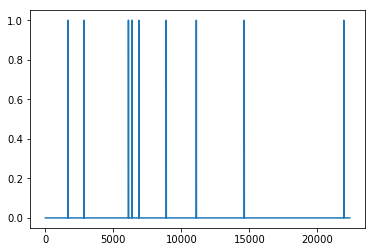

In [25]:
plt.plot(binned_velocity_df['GRIN018_H17_M41_S43'])

In [23]:
regions_by_session = {}
crossing_indicies_from_velocity_df = {}
to_concat = []
for session in list(grouped_raw_data.keys()):
    # gets indicies where animal crosses a velocity threshold
    # these indicies are from resampled df, need to find aligned section in resampled df 
    crossing_indicies = [sample for sample in utils_jjm.select_trigger_regions(binned_velocity_df[session], 0.5, 0.5, 20) if sample<len(grouped_raw_data[session]['C_normalized'])]
    crossing_indicies_from_velocity_df[session] = crossing_indicies
#crossing_indicies
#grouped_raw_data[session]['velocity_data'].iloc[crossing_indicies[0]].name
#nearest_resampled = dlc_utils.nearest(list(C_norm_df[session].index), grouped_raw_data[session]['velocity_data'].iloc[crossing_indicies[0]].name)
#nearest_resampled
#np.where(C_norm_df[session].index == nearest_resampled)[0][0]
#C_norm_df_reindexed[session].iloc[np.where(C_norm_df[session].index == nearest_resampled)[0][0], :]

    # for each cell average the basseline ~10 seconds before crossing the velocity threshold    
    
    if len(crossing_indicies)>0:
        print(session)
        movement_regions_in_recording = {}
        # only include samples that are within range of miniscope data
        for sample in crossing_indicies:
            #crossing indicies are from the velocity df with original sampling interval, find closest index in the resampled C_df by comparing timedeltas 
            nearest_resampled = dlc_utils.nearest(list(C_norm_df[session].index), grouped_raw_data[session]['velocity_data'].iloc[sample].name)
            integer_idx = np.where(C_norm_df[session].index == nearest_resampled)[0][0]  
                
            #use "resampled df" 
            raw_data_to_baseline = C_norm_df_reindexed[session]

            # so say baseline is 80 samples to 20 samples before threshold
            baseline_region = raw_data_to_baseline[integer_idx-80:integer_idx-20].reset_index(drop=True)
            movement_region = raw_data_to_baseline[integer_idx-80:integer_idx+80].reset_index(drop=True)

            baseline_region_std_dev = baseline_region.std(axis=0)
            baseline_region_mean = baseline_region.mean(axis=0)

            movement_region_z_scored = pd.DataFrame((movement_region-baseline_region_mean.values)/baseline_region_std_dev)
    
            movement_regions_in_recording[integer_idx] = movement_region_z_scored
        regions_by_session[session] = pd.concat(movement_regions_in_recording, axis=1, keys=list(movement_regions_in_recording.keys()))
        to_concat.append(session)
    
z_scored_regions_by_session = pd.concat(list(regions_by_session.values()), axis=1, keys=to_concat)

/home/jma819/.conda/envs/caiman/lib/python3.6/site-packages/jupyter_client/jsonutil.py:67: DeprecationWarning: Interpreting naive datetime as local 2021-02-22 16:41:49.447421. Please add timezone info to timestamps.
  new_obj[k] = extract_dates(v)


GRIN038_H13_M37_S23
GRIN041_H12_M54_S49
GRIN009_H13_M59_S14
GRIN018_H17_M41_S43
GRIN018_H16_M13_S53
GRIN011_H10_M19_S59
GRIN012_H17_M46_S35
GRIN012_H17_M32_S17
GRIN012_H16_M57_S23


In [26]:
session = to_concat[3]
session_df = z_scored_regions_by_session[session]
sample_crossing_indicies = crossing_indicies_from_velocity_df[session]
sample_crossing_indicies_Cdf = np.array([sample_idx for sample_idx in session_df.columns.levels[0] if sample_idx in session_df.columns])
print('session:', session)
print('threshold crossing indicies (from velocity data):' , sample_crossing_indicies)
print('cell indicies:' , list(set(z_scored_regions_by_session[session].columns.get_level_values(1))))
print('threshold crossing indicies in fluorescence trace: ', sample_crossing_indicies_Cdf)

session: GRIN018_H17_M41_S43
threshold crossing indicies (from velocity data): [1648, 2835, 6107, 6366, 6868, 8887, 11093, 14625]
cell indicies: [128, 1, 2, 3, 4, 5, 6, 7, 8, 132, 134, 11, 12, 135, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 27, 31, 33, 34, 38, 39, 40, 41, 42, 44, 45, 46, 47, 136, 49, 137, 51, 52, 53, 57, 58, 64, 65, 140, 69, 70, 74, 78, 79, 87, 88, 98, 104, 117, 120, 124]
threshold crossing indicies in fluorescence trace:  [ 412  709 1528 1593 1718 2223 2775 3659]


/home/jma819/.conda/envs/caiman/lib/python3.6/site-packages/jupyter_client/jsonutil.py:67: DeprecationWarning: Interpreting naive datetime as local 2021-02-22 16:44:15.114129. Please add timezone info to timestamps.
  new_obj[k] = extract_dates(v)


In [27]:
idx = 0
index = sample_crossing_indicies[idx]
print('sample crossing index: ', index)
frame_threshold_crossing = grouped_raw_data[session]['velocity_data'].iloc[index]['behavCam_frames']
behavCam_video = int(frame_threshold_crossing/1000)+1
frames_within_video =frame_threshold_crossing%1000
print('event occurs at ', frame_threshold_crossing, ' total frames')
print('behavCam ', behavCam_video, ' at ', frames_within_video, ' frames')

sample crossing index:  1648
event occurs at  2473.0  total frames
behavCam  3  at  473.0  frames


/home/jma819/.conda/envs/caiman/lib/python3.6/site-packages/jupyter_client/jsonutil.py:67: DeprecationWarning: Interpreting naive datetime as local 2021-02-22 16:44:25.006444. Please add timezone info to timestamps.
  new_obj[k] = extract_dates(v)


In [29]:
ani

/home/jma819/.conda/envs/caiman/lib/python3.6/site-packages/jupyter_client/jsonutil.py:67: DeprecationWarning: Interpreting naive datetime as local 2021-02-22 16:45:31.905684. Please add timezone info to timestamps.
  new_obj[k] = extract_dates(v)


/home/jma819/.conda/envs/caiman/lib/python3.6/site-packages/jupyter_client/jsonutil.py:67: DeprecationWarning: Interpreting naive datetime as local 2021-02-22 16:45:21.972269. Please add timezone info to timestamps.
  new_obj[k] = extract_dates(v)


Frame: 0/1000 ...


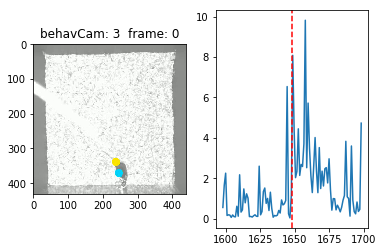

In [28]:
# could potentially just plot coordinates here instead of entire video 
# load behavior video 
frame_region = (int(frames_within_video)-50, int(frames_within_video)+50)
video = av.open('/projects/b1118/behaviorvideos/'+session+'/behavCam'+str(behavCam_video)+'DLC_resnet50_Open_Field_v2Jan27shuffle1_150000_labeled.mp4')
total_frames = video.streams.video[0].frames
movie_images = {}
for i, frame in enumerate(video.decode(video=0)):
    img = frame.to_image()  # PIL image
    movie_images[i] = img
    if i%1000==0:
        print("Frame: %d/%d ..." % (i, total_frames))
video.close()
movie_shape = np.shape(movie_images[1])
frame_subset = [movie_images[i] for i in range(frame_region[0], frame_region[1])]

fig, (ax1, ax2) = plt.subplots(1, 2)
im = ax1.imshow(frame_subset[0])
ax2.plot(np.linspace(index-50, index+50, 100), grouped_raw_data[session]['velocity_data']['tail_base'].iloc[index-50:index+50])
ax2.axvline(x=(index), linestyle='--', color='r')

#ax2.secondary_xaxis(-.2, functions=(lambda x: grouped_raw_data[session]['velocity_data'].iloc[x]['behavCam_frames'], 
#                                    lambda x: grouped_raw_data[session]['velocity_data'].iloc[x]['behavCam_frames']))
#ani = animation.ArtistAnimation(fig, matplotlib_images, interval=50, blit=True, repeat_delay=1000)
#HTML(ani.to_html5_video())
def init():
    ax1.set_title("behavCam: "+str(behavCam_video)+"  frame: "+str(0))
    im.set_data(frame_subset[0])
def animate(i):
    ax1.set_title("behavCam: "+str(behavCam_video)+"  frame: "+str(frame_region[0]+i))
    im.set_data(frame_subset[i])
    #ax2.axvline(x=(index-(50+i)), linestyle='--', color='r')
    return im

ani = animation.FuncAnimation(fig, animate, init_func=init, frames=len(frame_subset), interval=50)
rc('animation', html='jshtml')
#HTML(ani.to_html5_video())

In [22]:
##

/home/jma819/.conda/envs/caiman/lib/python3.6/site-packages/jupyter_client/jsonutil.py:67: DeprecationWarning: Interpreting naive datetime as local 2021-02-22 15:22:52.040617. Please add timezone info to timestamps.
  new_obj[k] = extract_dates(v)


/home/jma819/.conda/envs/caiman/lib/python3.6/site-packages/jupyter_client/jsonutil.py:67: DeprecationWarning: Interpreting naive datetime as local 2021-02-22 16:46:33.451856. Please add timezone info to timestamps.
  new_obj[k] = extract_dates(v)


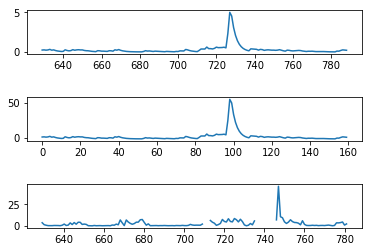

RMS noise: 7.318010044663862
Peak: 55.443982621421206
Peak/RMS: 7.57637421690201


In [30]:
##plot individual cell activity
#raw "pre z score" region
#velocity
idx=1
index = sample_crossing_indicies[idx]
#zscores
c_idx = sample_crossing_indicies_Cdf[idx]

cell = 1
fig, (ax1, ax2, ax3) = plt.subplots(3)
ax1.plot(C_norm_df_reindexed[session][cell][c_idx-80:c_idx+80]) 
ax2.plot(z_scored_regions_by_session[session][c_idx][cell])
ax3.plot(V_df_reindexed.loc[session]['tail_base'][c_idx-80:c_idx+80]) 
plt.subplots_adjust(hspace=1)
plt.show()

#display rms noise for trace 
rms = np.sqrt(np.mean(np.square(z_scored_regions_by_session[session][c_idx][cell])))
peak = np.max(z_scored_regions_by_session[session][c_idx][cell])
print('RMS noise:', rms)
print('Peak:', peak)
print('Peak/RMS:', peak/rms)

In [31]:
# calculate the peak to rms ratio for each threshold event, each cell, and across all cells and events, and sessions  

peak_rms = lambda cell_fluorescence : np.max(cell_fluorescence)/np.sqrt(np.mean(np.square(cell_fluorescence)))

session = to_concat[0]
print('session:', session)
session_df = z_scored_regions_by_session[session]

session: GRIN038_H13_M37_S23


/home/jma819/.conda/envs/caiman/lib/python3.6/site-packages/jupyter_client/jsonutil.py:67: DeprecationWarning: Interpreting naive datetime as local 2021-02-22 16:47:02.493682. Please add timezone info to timestamps.
  new_obj[k] = extract_dates(v)


In [32]:
sample_crossing_indicies = np.array([sample_idx for sample_idx in session_df.columns.levels[0] if sample_idx in session_df.columns])
print('threshold crossing indicies:' , sample_crossing_indicies)
print('cell indicies:' , list(set(z_scored_regions_by_session[session].columns.get_level_values(1))))
event = sample_crossing_indicies[0]
cell = list(set(z_scored_regions_by_session[session].columns.get_level_values(1)))[0]

threshold crossing indicies: [ 703 2869 3438 4162 6794 6894 8205 9055]
cell indicies: [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 13, 14, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 39, 41, 42, 43, 44, 45, 46, 47, 48, 49, 52, 53, 54, 55, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 81, 82, 83, 84, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 116, 117, 118, 119, 120, 121, 122, 123, 124, 126, 127, 128, 129, 130, 132, 134, 136, 137, 140, 141, 146, 149, 157, 158, 159, 160, 161, 162, 163, 165, 166, 167, 170, 171, 173, 175, 179, 189, 190, 191, 192, 193, 194, 199, 200, 202, 205, 209, 215, 219, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 234, 236, 237, 238, 239, 240, 247, 248, 250, 251, 252, 255, 257, 264, 265, 266, 267, 268, 269, 270]


/home/jma819/.conda/envs/caiman/lib/python3.6/site-packages/jupyter_client/jsonutil.py:67: DeprecationWarning: Interpreting naive datetime as local 2021-02-22 16:47:07.993572. Please add timezone info to timestamps.
  new_obj[k] = extract_dates(v)


In [33]:
#z_scored_regions_by_session[session].iloc[:, z_scored_regions_by_session[session].columns.get_level_values(1)==cell]

/home/jma819/.conda/envs/caiman/lib/python3.6/site-packages/jupyter_client/jsonutil.py:67: DeprecationWarning: Interpreting naive datetime as local 2021-02-22 16:47:08.900390. Please add timezone info to timestamps.
  new_obj[k] = extract_dates(v)


In [34]:
peak_rms_ratio_cell = z_scored_regions_by_session[session].iloc[:, z_scored_regions_by_session[session].columns.get_level_values(1)==cell].apply(lambda cell_fluorescence : np.max(cell_fluorescence)/np.sqrt(np.mean(np.square(cell_fluorescence))), axis=0)
peak_rms_ratio_event = z_scored_regions_by_session[session][event].apply(lambda cell_fluorescence : np.max(cell_fluorescence)/np.sqrt(np.mean(np.square(cell_fluorescence))), axis=0)
peak_rms_ratio = z_scored_regions_by_session[session].apply(lambda cell_fluorescence : np.max(cell_fluorescence)/np.sqrt(np.mean(np.square(cell_fluorescence))), axis=0)
peak_rms_ratio_all_sessions = pd.concat([z_scored_regions_by_session[session].apply(lambda cell_fluorescence : np.max(cell_fluorescence)/np.sqrt(np.mean(np.square(cell_fluorescence))), axis=0)
                                        for session in list(set(z_scored_regions_by_session.columns.get_level_values(0)))], axis=0, keys=list(set(z_scored_regions_by_session.columns.get_level_values(0))))

/home/jma819/.conda/envs/caiman/lib/python3.6/site-packages/jupyter_client/jsonutil.py:67: DeprecationWarning: Interpreting naive datetime as local 2021-02-22 16:47:09.540792. Please add timezone info to timestamps.
  new_obj[k] = extract_dates(v)
/home/jma819/.conda/envs/caiman/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


/home/jma819/.conda/envs/caiman/lib/python3.6/site-packages/jupyter_client/jsonutil.py:67: DeprecationWarning: Interpreting naive datetime as local 2021-02-22 16:47:16.849624. Please add timezone info to timestamps.
  new_obj[k] = extract_dates(v)
/home/jma819/.conda/envs/caiman/lib/python3.6/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/home/jma819/.conda/envs/caiman/lib/python3.6/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


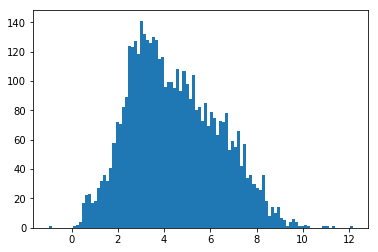

In [35]:
#histogram of all peak to rms ratios across sample events
plt.hist(peak_rms_ratio_all_sessions, 100)
plt.show()

In [36]:
## plot heatmap with different peak/RMS thresholds
# need to average cells within sessions

/home/jma819/.conda/envs/caiman/lib/python3.6/site-packages/jupyter_client/jsonutil.py:67: DeprecationWarning: Interpreting naive datetime as local 2021-02-22 16:47:37.430333. Please add timezone info to timestamps.
  new_obj[k] = extract_dates(v)


/home/jma819/.conda/envs/caiman/lib/python3.6/site-packages/jupyter_client/jsonutil.py:67: DeprecationWarning: Interpreting naive datetime as local 2021-02-22 16:47:38.003641. Please add timezone info to timestamps.
  new_obj[k] = extract_dates(v)


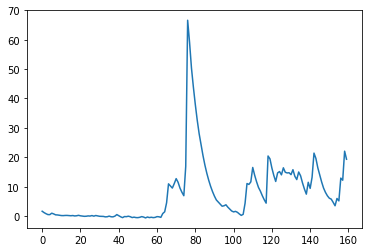

In [37]:
#plt.plot(cell_means_by_session[cell])
means_by_cell_by_session = pd.concat([z_scored_regions_by_session[session].groupby(level=[1], axis=1).mean() for session in list(set(z_scored_regions_by_session.columns.get_level_values(0)))], axis=1, 
                                     keys=list(set(z_scored_regions_by_session.columns.get_level_values(0))))
plt.plot(means_by_cell_by_session[session][cell])

In [38]:
#drop columns with infinity values (from start and end of session?)
inf_cells_to_exclude = means_by_cell_by_session.columns.to_series()[np.isinf(means_by_cell_by_session).any()].index
means_by_cell_by_session.drop(inf_cells_to_exclude, axis=1, inplace=True)

/home/jma819/.conda/envs/caiman/lib/python3.6/site-packages/jupyter_client/jsonutil.py:67: DeprecationWarning: Interpreting naive datetime as local 2021-02-22 16:47:40.380547. Please add timezone info to timestamps.
  new_obj[k] = extract_dates(v)


In [39]:
#means_by_cell_by_session

/home/jma819/.conda/envs/caiman/lib/python3.6/site-packages/jupyter_client/jsonutil.py:67: DeprecationWarning: Interpreting naive datetime as local 2021-02-22 16:47:44.090368. Please add timezone info to timestamps.
  new_obj[k] = extract_dates(v)


/home/jma819/.conda/envs/caiman/lib/python3.6/site-packages/jupyter_client/jsonutil.py:67: DeprecationWarning: Interpreting naive datetime as local 2021-02-22 16:47:44.638421. Please add timezone info to timestamps.
  new_obj[k] = extract_dates(v)


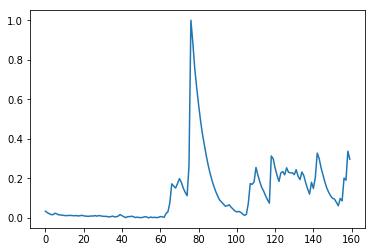

In [40]:
# range scale data
scaler = MinMaxScaler()
activity_scaled = pd.DataFrame(scaler.fit_transform(means_by_cell_by_session), columns=means_by_cell_by_session.columns)
#e.g. traces 
plt.plot(activity_scaled[session][cell])

In [41]:
# sort events by latency from threshold crossing
def sort_array_by_latency(unsorted_dataframe):
    latency = unsorted_dataframe.idxmax(axis=0)
    latency_flat = latency.reset_index()
    latency_sorted = latency_flat.sort_values(by=0)
    sorted_by_peak_latency = np.empty([unsorted_dataframe.shape[1], unsorted_dataframe.shape[0]])
    for row_idx in range(len(list(latency_sorted.index))):
        sorted_by_peak_latency[row_idx] = unsorted_dataframe[latency_sorted.loc[list(latency_sorted.index)[row_idx]]['level_0']][latency_sorted.loc[list(latency_sorted.index)[row_idx]]['level_1']]
    return(sorted_by_peak_latency)

/home/jma819/.conda/envs/caiman/lib/python3.6/site-packages/jupyter_client/jsonutil.py:67: DeprecationWarning: Interpreting naive datetime as local 2021-02-22 16:47:49.629475. Please add timezone info to timestamps.
  new_obj[k] = extract_dates(v)


In [42]:
# heatmap with all cells
all_cells_heatmap = sort_array_by_latency(activity_scaled)
# filter out cells based on peak/noise ratio
peak_rms_ratio_by_cell_by_session = pd.concat([peak_rms_ratio_all_sessions[session].groupby(level=[1], axis=0).mean() for session in list(set(peak_rms_ratio_all_sessions.index.get_level_values(0)))], axis=0, 
                                     keys=list(set(peak_rms_ratio_all_sessions.index.get_level_values(0))))

#remove cells already excluded for infinity values 
peak_rms_ratio_by_cell_by_session.drop(inf_cells_to_exclude, axis=0, inplace=True)
filtered_by_peak = activity_scaled[peak_rms_ratio_by_cell_by_session.loc[peak_rms_ratio_by_cell_by_session>4].index]
filtered_by_peak_heatmap = sort_array_by_latency(filtered_by_peak)

/home/jma819/.conda/envs/caiman/lib/python3.6/site-packages/jupyter_client/jsonutil.py:67: DeprecationWarning: Interpreting naive datetime as local 2021-02-22 16:47:50.391538. Please add timezone info to timestamps.
  new_obj[k] = extract_dates(v)


/home/jma819/.conda/envs/caiman/lib/python3.6/site-packages/jupyter_client/jsonutil.py:67: DeprecationWarning: Interpreting naive datetime as local 2021-02-22 16:55:28.690768. Please add timezone info to timestamps.
  new_obj[k] = extract_dates(v)


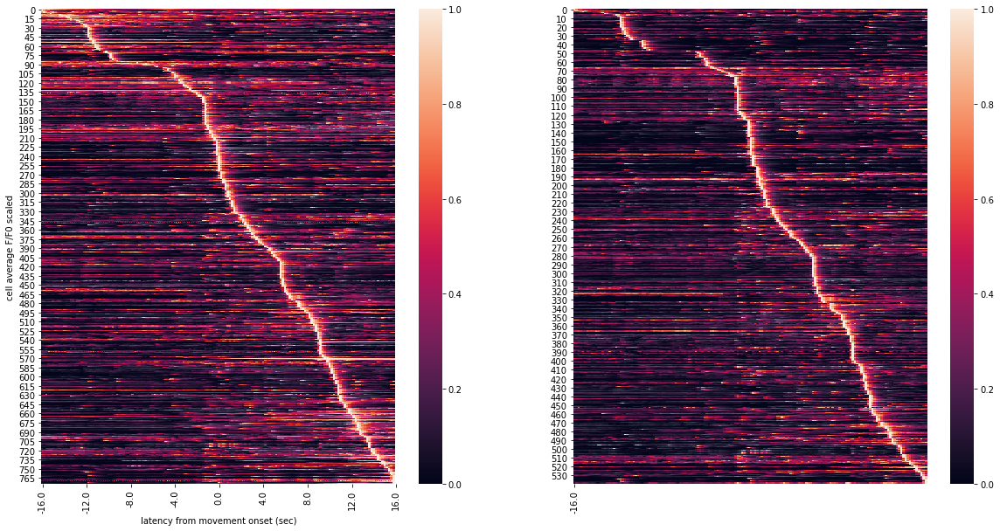

In [44]:
X_labels = np.linspace(-16, 16, 161)
fig = plt.figure()
fig.set_size_inches(20, 10)
p1 = fig.add_subplot(1,2,1)
ax = sns.heatmap(all_cells_heatmap, xticklabels=X_labels)
ax.set_xticks(ax.get_xticks()[::20])
ax.set_xticklabels(X_labels[::20])
p2 = fig.add_subplot(1,2,2)
ax2 = sns.heatmap(filtered_by_peak_heatmap, xticklabels=X_labels)
ax2.set_xticks(ax.get_xticks()[::20])
ax2.set_xticklabels(X_labels[::20])
ax.set_ylabel('cell average F/F0 scaled')
ax.set_xlabel('latency from movement onset (sec)')
fig.savefig('/projects/p30771/miniscope/analysis/OpenFieldAnalysis/022021/ko_velocity_spatial_coord_triggered.svg', transparent=True)
plt.show()